## Modelo de detecção de objetos para detectar bananas

Dada uma imagem de bananas, o modelo tem como objetivo detectar a posição das bananas e classifica-lás nos 6 estágios a seguir:

- freshripe (fresco maduro)
- freshunripe (fresco não maduro)
- overripe (maduro demais)
- ripe (maduro)
- rotten (podre)
- unripe (imaturo)

## **O que iremos fazer?**

### Entrega 1:

Iremos treinar 2 modelos: um com 5 épocas e outro com 10 épocas para fazer a comparação de performance entre ambos, com o objetivo de validar se o modelo melhora ou piora ao longo das épocas.

### Entrega 2:
Em seguida, iremos realizar a comparação com um modelo YOLO tradicional, ou seja, o modelo pré-treinado, com o objetivo de visualizar os resultados retornados, sem treiná-lo com os dados específicos do nosso dataset de bananas e ver como as predições deste modelo se comportam.

Este processo faz parte de um dos entregáveis da Entrega 2.

**No final do notebook há uma conclusão sobre os 3 modelos.**

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.8/993.8 kB 22.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 79.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 80.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 49.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 33.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 17.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 98.7 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstal

In [ ]:
import os
import matplotlib.pyplot as plt
import matplotlib.patches as ptc
import cv2
from pathlib import Path
from random import randint
import numpy as np
from datetime import datetime
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


Montagem do google drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Preparação do dataset

O dataset que iremos utilizar se encontra no seguinte site:

[Banana Ripening Process Computer Vision Project](https://universe.roboflow.com/fruit-ripening/banana-ripening-process)

Está estruturado da seguinte forma:

- train
  - images
  - labels
- valid
  - images
  - labels
- test
  - images
  - labels

Há um arquivo yaml (data.yaml) com as configurações do dataset e classes.

Copia o dataset do google drive para o google colab.

In [ ]:
cp /content/drive/MyDrive/Datasets/Banana_detector.yolov11.zip /content

Descompacta o zip dentro da pasta dataset.

In [ ]:
!unzip Banana_detector.yolov11.zip -d dataset/

A saída de streaming foi truncada nas últimas 5000 linhas.
  inflating: dataset/train/labels/musa-acuminata-rotten-b0b8fdd8-1d0a-11ec-a884-d8c4975e38aa_jpg.rf.0815c4e32ed78bfb99a9ec5d77ec2665.txt  
  inflating: dataset/train/labels/musa-acuminata-rotten-b0b8fdd8-1d0a-11ec-a884-d8c4975e38aa_jpg.rf.15655709617bef606d060c892513ecbd.txt  
  inflating: dataset/train/labels/musa-acuminata-rotten-b0b8fdd8-1d0a-11ec-a884-d8c4975e38aa_jpg.rf.83ca0d3e7dbe94ac1cd31e6743588a85.txt  
  inflating: dataset/train/labels/musa-acuminata-rotten-b0bdc348-1d0a-11ec-a245-d8c4975e38aa_jpg.rf.18183b4810c420c7b8ce6c07c47556dd.txt  
  inflating: dataset/train/labels/musa-acuminata-rotten-b0bdc348-1d0a-11ec-a245-d8c4975e38aa_jpg.rf.5fa12df45ab32b7fad12039c45a87509.txt  
  inflating: dataset/train/labels/musa-acuminata-rotten-b0bdc348-1d0a-11ec-a245-d8c4975e38aa_jpg.rf.c50b6b706f3d907c6081a7681d486ed9.txt  
  inflating: dataset/train/labels/musa-acuminata-rotten-b0c28581-1d0a-11ec-b9b5-d8c4975e38aa_jpg.rf.06e52c9

#### Visualização do arquivo yaml

In [ ]:
!cat dataset/data.yaml

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 6
names: ['freshripe', 'freshunripe', 'overripe', 'ripe', 'rotten', 'unripe']

roboflow:
  workspace: fruit-ripening
  project: banana-ripening-process
  version: 2
  license: CC BY 4.0
  url: https://universe.roboflow.com/fruit-ripening/banana-ripening-process/dataset/2

Reescrevendo o data.yaml com o caminho correto para os datasets.

In [ ]:
%%writefile dataset/data.yaml
path: '/content/dataset/'
train: 'train/'
val: 'valid/'
test: 'test/'

nc: 6
names: ['freshripe', 'freshunripe', 'overripe', 'ripe', 'rotten', 'unripe']

roboflow:
  workspace: fruit-ripening
  project: banana-ripening-process
  version: 2
  license: CC BY 4.0
  url: https://universe.roboflow.com/fruit-ripening/banana-ripening-process/dataset/2

Overwriting dataset/data.yaml


### Visualização de algumas bananas do dataset de treino

In [ ]:
train_images_dir = 'dataset/train/images'
train_labels_dir = 'dataset/train/labels'
os.path.exists(train_images_dir)

True

In [ ]:
files_images = [file for file in Path(train_images_dir).glob('*.jpg') if not file.is_dir()]
files_labels = [file for file in Path(train_labels_dir).glob('*.txt') if not file.is_dir()]

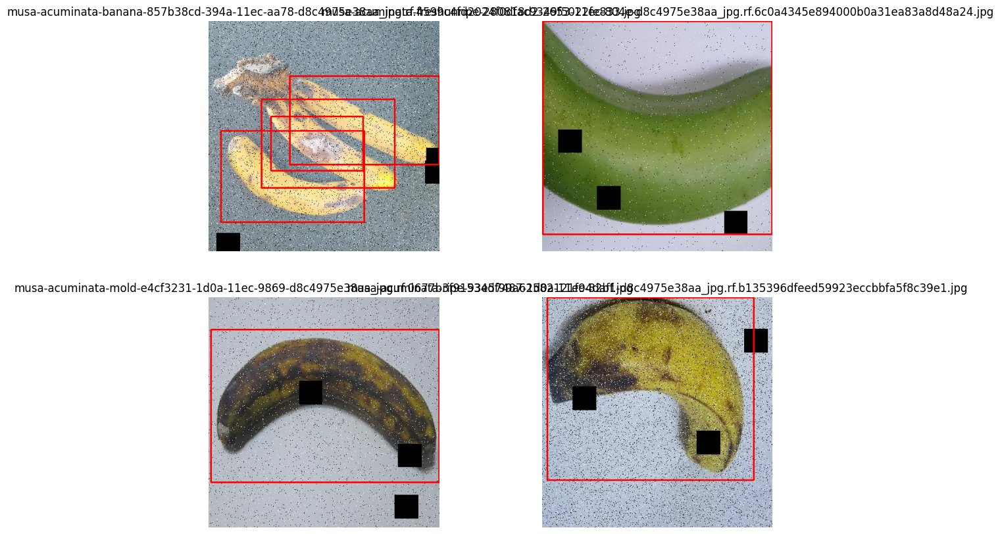

In [ ]:
plt.figure(figsize=(12,10))
for i in range(0, 4):
  # Sorteia uma imagem de raio x para exibir
  path_img = files_images[randint(0, len(files_images) -1)]
  # Adquire o label referente a imagem sorteada
  path_label = [path for path in files_labels if path.stem == path_img.stem][0] # stem retorna o nome do arquivo SEM a extensão

  bboxes = []
  # Faz a leitura do arquivo txt com as labels correspondentes (bounding boxes)
  with open(path_label, 'rb') as f:
    for line in f:
      line = line.decode('utf-8').split(' ')
      bboxes.append(np.array(line).astype(np.float32))

  # Le a imagem e transforma para rgb
  img = cv2.imread(path_img)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  H, W, _ = img.shape

  # Desenha as bounding boxes
  for box in bboxes:
    classe, x_center, y_center, w, h = box

    x1 = round((x_center - w / 2) * W)
    y1 = round((y_center - h / 2) * H)
    x2 = round((x_center + w / 2) * W)
    y2 = round((y_center + h / 2) * H)

    if x1 < 0:
        l = 0
    if x2 > W - 1:
        r = W - 1
    if y1 < 0:
        t = 0
    if y2 > H - 1:
        b = H - 1

    cv2.rectangle(img, (x1, y1), (x2, y2), (255,0,0), 2)

  # Exibe a imagem com as bboxes
  plt.subplot(2,2, i +1)
  plt.title(f'{path_img.name}')
  plt.axis('off')
  plt.imshow(img)

Função para visualizar alguma imagem.

In [ ]:
def view(img):
  fig = plt.gcf()
  fig.set_size_inches(16,10)
  plt.axis('off')
  plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  plt.show()

### Treinamento

Os modelos pré-treinados podem ser encontrados no github do Ultralytics:

- [Ultralytics Github Releases](https://github.com/ultralytics/assets/releases/)

Hiperparâmetros do treinamento:

- [Ultralytics Train Settings](https://docs.ultralytics.com/pt/modes/train/#train-settings)

Dicas para melhorar os resultados do treinamento:

- [Tips for best training results](https://docs.ultralytics.com/pt/yolov5/tutorials/tips_for_best_training_results/#model-selection)

In [ ]:
CONFIG_FILE = '/content/dataset/data.yaml'
RESULT_TRAIN_NAME_5 = 'yolo11l_banana_detector_5_epochs'
os.path.exists(CONFIG_FILE)

True

In [ ]:
model_5 = YOLO('yolo11m.pt')

#### Treinando o modelo com 5 épocas.

In [ ]:
start_time = datetime.now()

history_10 = model_5.train(data=CONFIG_FILE,
                      epochs=5,
                      imgsz=640,
                      patience=3,
                      exist_ok=True, # Caso a pasta de resultados (parametro 'name') já existir, realiza a substituição dos arquivos
                      batch=32, # -1 define o lote (batch_size) ideal para a GPU utilizada
                      name=RESULT_TRAIN_NAME_5)

end_time = datetime.now()

elapsed_time = end_time - start_time

Ultralytics 8.3.102 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: task=detect, mode=train, model=yolo11m.pt, data=/content/dataset/data.yaml, epochs=5, time=None, patience=3, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolo11l_banana_detector_10_epochs, exist_ok=True, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, 

train: Scanning /content/dataset/train/labels.cache... 15792 images, 0 backgrounds, 0 corrupt: 100%|██████████| 15792/15792 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/dataset/valid/labels.cache... 1525 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1525/1525 [00:00<?, ?it/s]


Plotting labels to runs/detect/yolo11l_banana_detector_10_epochs/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001, momentum=0.9) with parameter groups 106 weight(decay=0.0), 113 weight(decay=0.0005), 112 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/yolo11l_banana_detector_10_epochs
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      19.8G      1.267      1.402      1.574         79        640: 100%|██████████| 494/494 [06:05<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:15<00:00,  1.57it/s]

                   all       1525       3012      0.618      0.687      0.697      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      19.8G      1.194      1.278       1.52         75        640: 100%|██████████| 494/494 [06:01<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:15<00:00,  1.57it/s]

                   all       1525       3012      0.712      0.719      0.778      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      19.9G      1.141      1.185      1.475         67        640: 100%|██████████| 494/494 [05:57<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:15<00:00,  1.57it/s]

                   all       1525       3012      0.667      0.713      0.748      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      19.9G      1.079      1.078      1.431         69        640: 100%|██████████| 494/494 [05:57<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:15<00:00,  1.58it/s]

                   all       1525       3012      0.775      0.747      0.834       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      19.9G      1.026     0.9691      1.385         63        640: 100%|██████████| 494/494 [05:57<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:15<00:00,  1.58it/s]

                   all       1525       3012      0.775      0.821      0.878       0.63



5 epochs completed in 0.524 hours.
Optimizer stripped from runs/detect/yolo11l_banana_detector_10_epochs/weights/last.pt, 40.5MB
Optimizer stripped from runs/detect/yolo11l_banana_detector_10_epochs/weights/best.pt, 40.5MB

Validating runs/detect/yolo11l_banana_detector_10_epochs/weights/best.pt...
Ultralytics 8.3.102 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
YOLO11m summary (fused): 125 layers, 20,034,658 parameters, 0 gradients, 67.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:15<00:00,  1.55it/s]


                   all       1525       3012      0.776      0.821      0.878       0.63
             freshripe        264        315      0.744      0.879      0.914      0.729
           freshunripe        185        417      0.868      0.621      0.872      0.645
              overripe        341        438      0.855      0.922      0.946      0.749
                  ripe        424        654      0.785      0.847      0.908      0.654
                rotten        527        780      0.785      0.747      0.796      0.458
                unripe        161        408      0.622      0.907      0.833      0.544
Speed: 0.2ms preprocess, 6.4ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/detect/yolo11l_banana_detector_10_epochs


In [ ]:
print(f'Tempo de treinamento: {elapsed_time}')

Tempo de treinamento: 0:31:56.426643


##### Avaliação do modelo

In [ ]:
# Necessário para funcionar o código de validação da próxima célula
import locale
locale.getpreferredencoding = lambda: "UTF-8"

Cria um yaml para os dados de teste, pois não existe um mode=test na CLI.

In [ ]:
!touch dataset/data_test.yaml

In [ ]:
%%writefile dataset/data_test.yaml
path: '/content/dataset/'
train: 'train/'
val: 'test/'
test:

nc: 6
names: ['freshripe', 'freshunripe', 'overripe', 'ripe', 'rotten', 'unripe']

roboflow:
  workspace: fruit-ripening
  project: banana-ripening-process
  version: 2
  license: CC BY 4.0
  url: https://universe.roboflow.com/fruit-ripening/banana-ripening-process/dataset/2

Overwriting dataset/data_test.yaml


In [ ]:
RESULT_TEST_NAME_5 = 'yolo11m_model_eval_5_epochs'

In [ ]:
!yolo task=detect mode=val conf=0.6 exist_ok=true model=/content/runs/detect/{RESULT_TRAIN_NAME_5}/weights/best.pt name={RESULT_TEST_NAME_5} data=/content/dataset/data_test.yaml

Ultralytics 8.3.102 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
YOLO11m summary (fused): 125 layers, 20,034,658 parameters, 0 gradients, 67.7 GFLOPs
val: Scanning /content/dataset/test/labels... 757 images, 0 backgrounds, 0 corrupt: 100% 757/757 [00:00<00:00, 1523.65it/s]
val: New cache created: /content/dataset/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 48/48 [00:11<00:00,  4.36it/s]
                   all        757       1519      0.923       0.67      0.806      0.638
             freshripe        130        156      0.924      0.782      0.876      0.738
           freshunripe         99        212          1      0.373      0.686      0.629
              overripe        145        178      0.903      0.893      0.918      0.778
                  ripe        205        351      0.918      0.732      0.832      0.621
                rotten        288        448       0.95      0.507      0.724

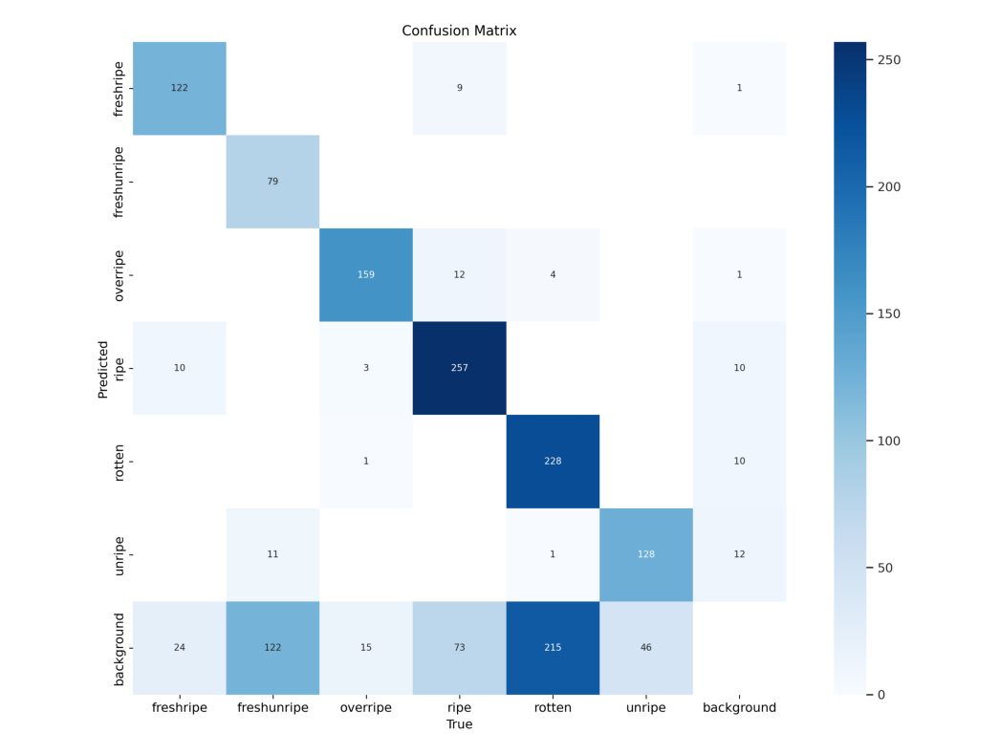

In [ ]:
dir_result_test_5 = f'/content/runs/detect/{RESULT_TEST_NAME_5}'

conf_matrix = cv2.imread(os.path.join(dir_result_test_5, 'confusion_matrix.png'))
view(conf_matrix)

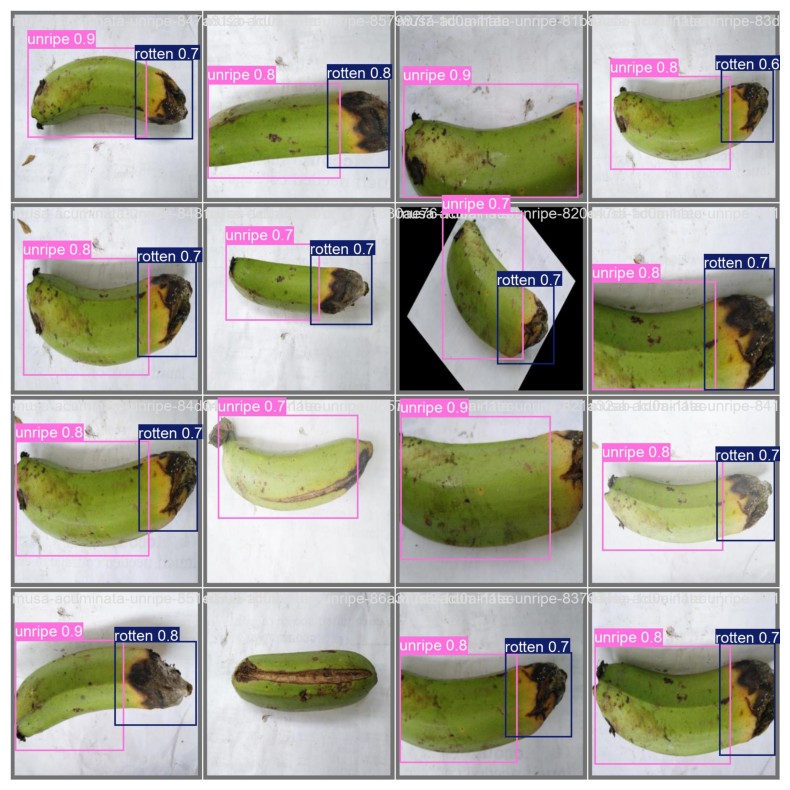

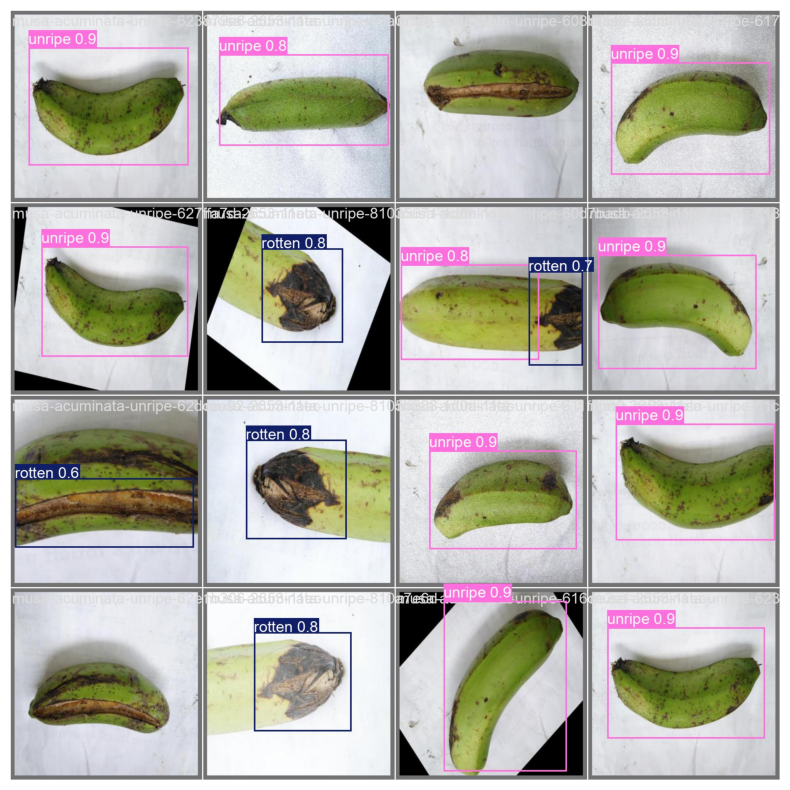

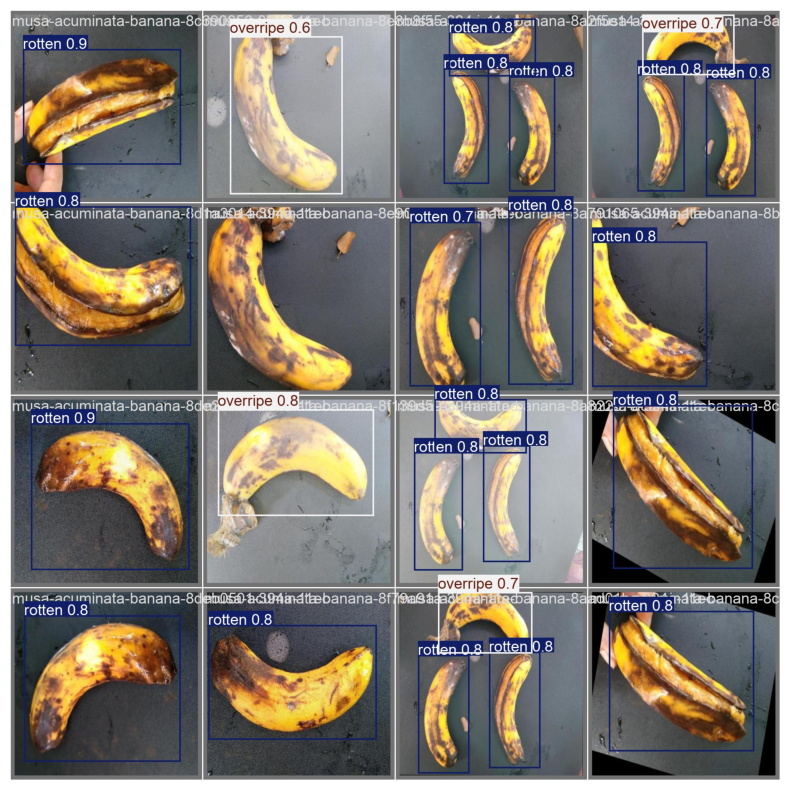

In [ ]:
for i in range(0,3,1):
  batch0_pred_results = cv2.imread(os.path.join(dir_result_test_5, f'val_batch{i}_pred.jpg'))
  view(batch0_pred_results)

#### Treinando o modelo com 10 épocas

In [ ]:
RESULT_TRAIN_NAME_10 = 'yolo11l_banana_detector_10_epochs'

In [ ]:
model_10 = YOLO('yolo11m.pt')

In [ ]:
start_time = datetime.now()

history_10 = model_10.train(data=CONFIG_FILE,
                      epochs=10,
                      imgsz=640,
                      patience=10,
                      exist_ok=True, # Caso a pasta de resultados (parametro 'name') já existir, realiza a substituição dos arquivos
                      batch=32, # -1 define o lote (batch_size) ideal para a GPU utilizada
                      name=RESULT_TRAIN_NAME_10)

end_time = datetime.now()

elapsed_time = end_time - start_time

Ultralytics 8.3.102 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: task=detect, mode=train, model=yolo11m.pt, data=/content/dataset/data.yaml, epochs=10, time=None, patience=10, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolo11l_banana_detector_10_epochs, exist_ok=True, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True

train: Scanning /content/dataset/train/labels.cache... 15792 images, 0 backgrounds, 0 corrupt: 100%|██████████| 15792/15792 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/dataset/valid/labels.cache... 1525 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1525/1525 [00:00<?, ?it/s]


Plotting labels to runs/detect/yolo11l_banana_detector_10_epochs/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001, momentum=0.9) with parameter groups 106 weight(decay=0.0), 113 weight(decay=0.0005), 112 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/yolo11l_banana_detector_10_epochs
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      16.6G      1.308      1.771      1.745         26        640: 100%|██████████| 494/494 [06:06<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:15<00:00,  1.55it/s]


                   all       1525       3012      0.379      0.584      0.498      0.279

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      16.5G      1.291      1.358      1.714         30        640: 100%|██████████| 494/494 [06:00<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:15<00:00,  1.56it/s]

                   all       1525       3012      0.643      0.652      0.702      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      16.5G      1.215      1.203      1.638         25        640: 100%|██████████| 494/494 [05:56<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:15<00:00,  1.57it/s]

                   all       1525       3012      0.671      0.581      0.658       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      16.5G       1.16      1.086       1.59         38        640: 100%|██████████| 494/494 [05:56<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:15<00:00,  1.56it/s]

                   all       1525       3012      0.484      0.692       0.63       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      16.5G      1.102     0.9615       1.53         37        640: 100%|██████████| 494/494 [05:56<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:15<00:00,  1.57it/s]

                   all       1525       3012      0.725      0.731      0.795      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      16.5G      1.059     0.8827      1.487         25        640: 100%|██████████| 494/494 [05:56<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:15<00:00,  1.57it/s]

                   all       1525       3012      0.733      0.795      0.832      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      16.5G      1.024     0.8127      1.455         31        640: 100%|██████████| 494/494 [05:56<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:15<00:00,  1.57it/s]

                   all       1525       3012      0.801      0.789      0.875      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      16.5G     0.9935     0.7516      1.426         40        640: 100%|██████████| 494/494 [05:56<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:15<00:00,  1.57it/s]

                   all       1525       3012      0.799      0.813      0.878       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      16.5G     0.9592     0.6987      1.395         32        640: 100%|██████████| 494/494 [05:56<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:15<00:00,  1.58it/s]

                   all       1525       3012      0.829       0.84      0.909      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      16.5G     0.9348     0.6425      1.375         29        640: 100%|██████████| 494/494 [05:56<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:15<00:00,  1.58it/s]

                   all       1525       3012      0.824      0.851      0.914      0.676



10 epochs completed in 1.043 hours.
Optimizer stripped from runs/detect/yolo11l_banana_detector_10_epochs/weights/last.pt, 40.5MB
Optimizer stripped from runs/detect/yolo11l_banana_detector_10_epochs/weights/best.pt, 40.5MB

Validating runs/detect/yolo11l_banana_detector_10_epochs/weights/best.pt...
Ultralytics 8.3.102 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
YOLO11m summary (fused): 125 layers, 20,034,658 parameters, 0 gradients, 67.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:15<00:00,  1.54it/s]


                   all       1525       3012      0.823      0.851      0.914      0.676
             freshripe        264        315       0.82      0.883      0.939      0.762
           freshunripe        185        417      0.803      0.789      0.891      0.666
              overripe        341        438      0.905      0.953      0.965      0.803
                  ripe        424        654      0.783      0.898      0.927      0.694
                rotten        527        780      0.839      0.788       0.88      0.537
                unripe        161        408       0.79      0.794       0.88      0.591
Speed: 0.2ms preprocess, 6.4ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/detect/yolo11l_banana_detector_10_epochs


##### Avaliação do modelo

In [ ]:
RESULT_TEST_NAME_10 = 'yolo11m_model_eval_10_epochs'

In [ ]:
!yolo task=detect mode=val conf=0.6 exist_ok=true model=/content/runs/detect/{RESULT_TRAIN_NAME_10}/weights/best.pt name={RESULT_TEST_NAME_10} data=/content/dataset/data_test.yaml

Ultralytics 8.3.102 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
YOLO11m summary (fused): 125 layers, 20,034,658 parameters, 0 gradients, 67.7 GFLOPs
val: Scanning /content/dataset/test/labels.cache... 757 images, 0 backgrounds, 0 corrupt: 100% 757/757 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 48/48 [00:11<00:00,  4.33it/s]
                   all        757       1519      0.943      0.708      0.839      0.677
             freshripe        130        156      0.939      0.795      0.887      0.762
           freshunripe         99        212      0.948      0.693      0.834      0.731
              overripe        145        178      0.946      0.792      0.886      0.771
                  ripe        205        351      0.909      0.769       0.86      0.657
                rotten        288        448      0.972      0.551      0.764      0.561
                unripe         77        174      0

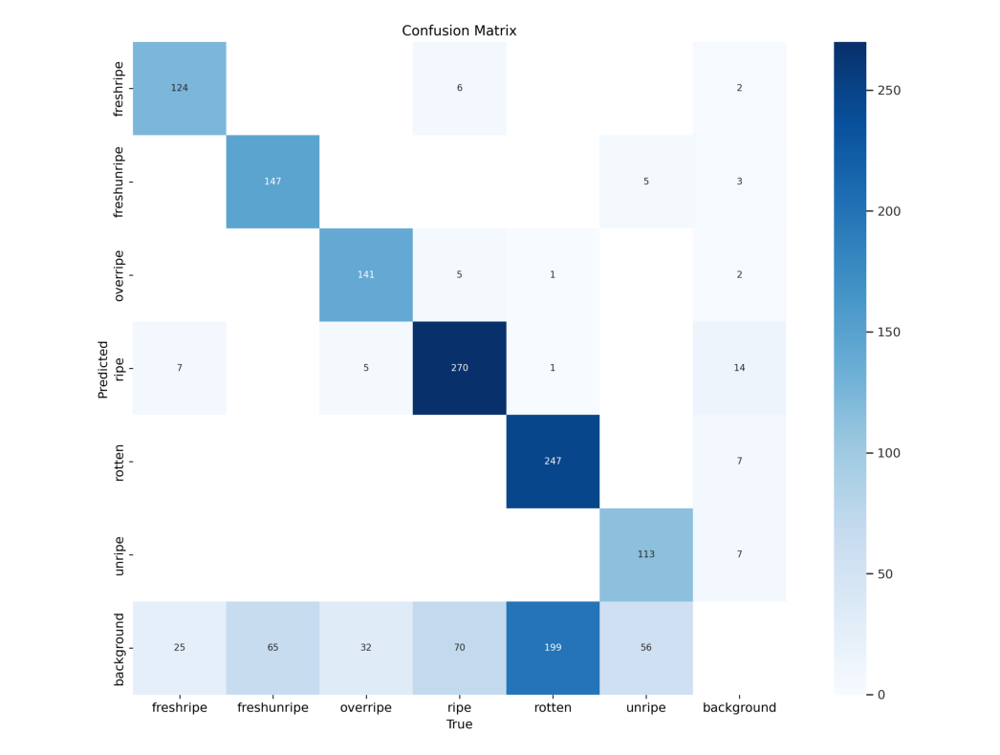

In [ ]:
dir_result_test_10 = f'/content/runs/detect/{RESULT_TEST_NAME_10}'

conf_matrix = cv2.imread(os.path.join(dir_result_test_10, 'confusion_matrix.png'))
view(conf_matrix)

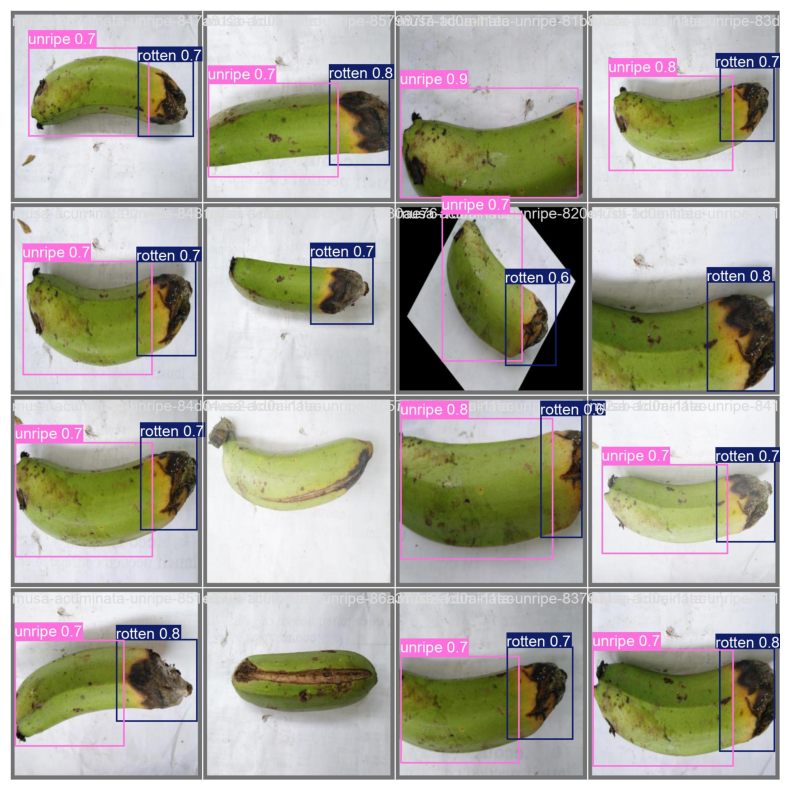

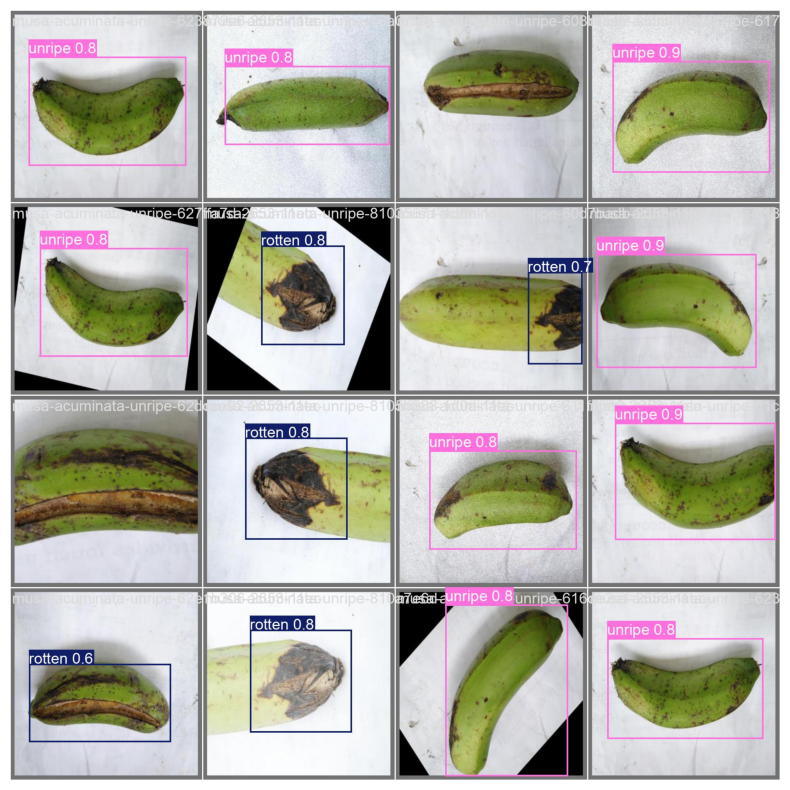

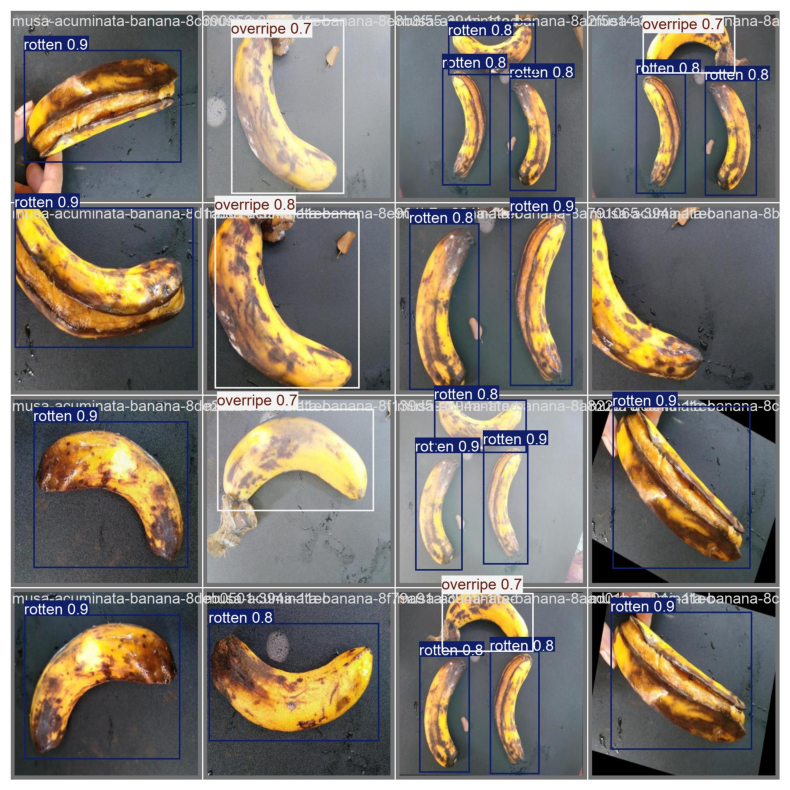

In [ ]:
for i in range(0,3,1):
  batch0_pred_results = cv2.imread(os.path.join(dir_result_test_10, f'val_batch{i}_pred.jpg'))
  view(batch0_pred_results)

### Envia resultados para o Google Drive

Enviando modelo com melhores pesos, no caso, o modelo com 10 épocas.

In [ ]:
!cp -R /content/runs/detect/{RESULT_TRAIN_NAME_10} /content/drive/MyDrive/Datasets/Models/Banana_Models

In [ ]:
!cp -R /content/runs/detect/{RESULT_TEST_NAME_10} /content/drive/MyDrive/Datasets/Models/Banana_Models

### Comparação com modelo YOLO tradicional (Parte da Entrega 2)

O objetivo desta seção é comparar a YOLO tradicional (algoritmo de detecção de objetos genéricos) com o nosso problema específico de detecção de bananas nos 6 estágios mencionados acima.

In [ ]:
RESULT_TEST_DEFAULT_NAME = 'yolo_default_eval'
dir_result_default_yolo = f'/content/runs/detect/{RESULT_TEST_DEFAULT_NAME}'

In [ ]:
!yolo task=detect mode=val conf=0.25 exist_ok=true model=yolo11m.pt name=yolo_default_eval data=/content/dataset/data_test.yaml

100% 38.8M/38.8M [00:00<00:00, 146MB/s]
Ultralytics 8.3.102 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
YOLO11m summary (fused): 125 layers, 20,091,712 parameters, 0 gradients, 68.0 GFLOPs
100% 755k/755k [00:00<00:00, 18.9MB/s]
val: Scanning /content/dataset/test/labels... 757 images, 0 backgrounds, 0 corrupt: 100% 757/757 [00:00<00:00, 1431.30it/s]
val: New cache created: /content/dataset/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 48/48 [00:12<00:00,  4.00it/s]
                   all        757       1519          0          0          0          0
                person        130        156          0          0          0          0
               bicycle         99        212          0          0          0          0
                   car        145        178          0          0          0          0
            motorcycle        205        351          0          0          0          

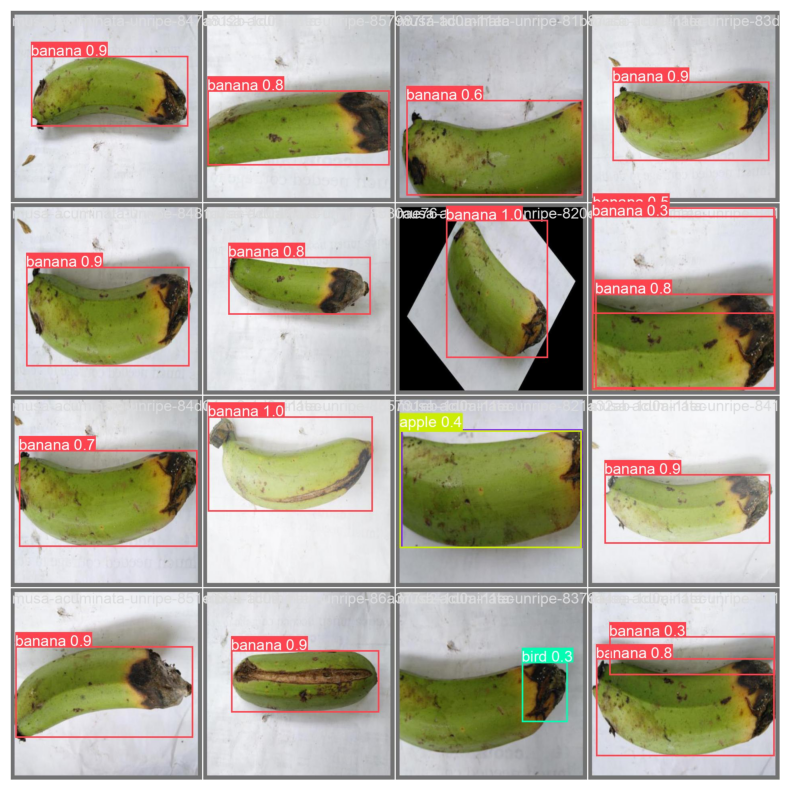

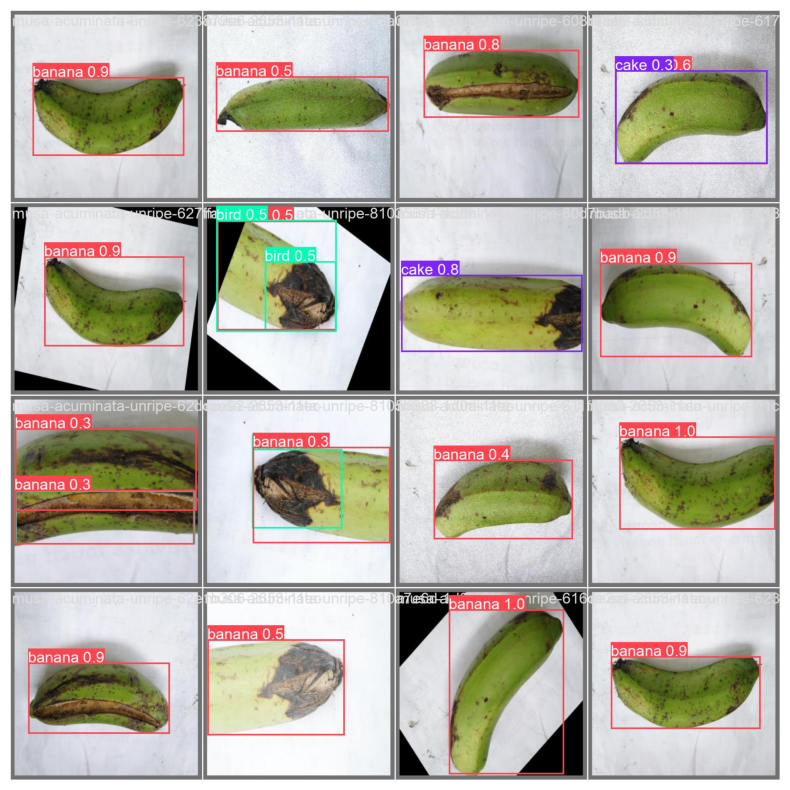

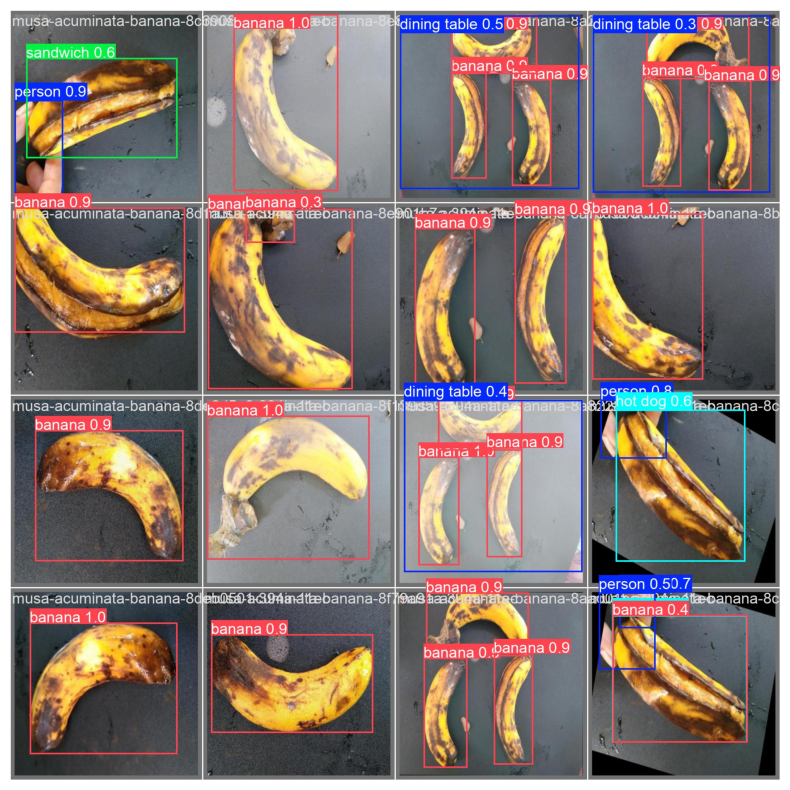

In [ ]:
for i in range(0,3,1):
  batch0_pred_results = cv2.imread(os.path.join(dir_result_default_yolo, f'val_batch{i}_pred.jpg'))
  view(batch0_pred_results)

### Conclusão

### **Comparações entre os modelos com 5 e 10 épocas**

Os modelos que foram treinados para detectar as bananas e classificá-las nos estágios (o primeiro e o segundo modelo) tiveram desempenhos semelhantes, porém, o modelo com 10 épocas foi aquele que mais performou.

O motivo disto, está no fato de que apenas realizar um treinamento com poucas épocas (no caso, 5 épocas) não é o suficiente para o modelo convergir bem em direção ao menor valor de perda, e consequentemente ter boas predições. É possível ver a diferença entre os dois modelos principalmente na **matriz de confusão**, onde o modelo com menos épocas errou mais e relação ao modelo com 10 épocas. Portanto, é possível afirmar de que para este contexto e dados específicos, seria interessante treinar por mais épocas.

No caso, treinamos os dois modelos com poucas épocas pois, temos disponíveis em torno de 15 mil bananas nos dados de treinamento, o que consequentemente fazia o tempo de treinamento de uma única época ser por volta de 6 minutos. Ou seja, se treinamos o primeiro modelo com 5 épocas, então 6x5 = 30 minutos aproximadamente. O segundo modelo foi com o dobro de épocas, consequentemente demorou o dobro do tempo. Portanto, treinar o modelo pela quantidade de épocas adequadas é dispendioso, então decidimos treinar com poucas épocas apenas para fins de aprendizado e visualizar que há diferenças em um modelo treinado com poucas épocas em comparação com um modelo treinado com várias épocas.

### **Comparação com o modelo YOLO tradicional**

Esta parte da atividade se enquadra em um dos entregáveis da *Entrega 2*.

Fizemos a comparação utilizando a CLI do Yolo, onde realizamos a validação nos dados de teste, porém utilizando o nosso dataset específico para realizar o treinamento.

Talvez não foi a melhor forma de realizar a validação, pois o modelo teria uma métrica bem ruim pelo fato de que também estaria avaliando outras categorias (como carros, motos, ônibus, etc), mas pelo fato deste tipo de avaliação ser automática, este comando foi útil para retornar os resultados de predições do modelo tradicional em imagens, onde é possível observar que, pelo motivo do modelo ser bom em predições genéricas, apenas foi detectado a presença de bananas, porém não foi classificado os estágios das mesmas, apenas a detecção da posição e da classificação que seria uma banana. Porém, nem sempre o resultado da predição era uma banana, as vezes o modelo se confundia com alguma outra classe, como por exemplo, passáros, bolos ou sanduíches.

**O que é possível concluir disso?**

Pois bem, para realizar predições customizadas é necessário o treinamento com datasets específicos para o objetivo desejado, caso contrário, o modelo continuará tendo resultados genéricos e dependendo do contexto não apresentará resultados satisfatórios, como por exemplo o nosso próprio caso, onde o objetivo era realizar a detecção das bananas e classificá-las entre maduras, não maduras, podres e etc. O modelo tradicional apenas tem o conhecimento para classificá-las como bananas, portanto, não teve o devido conhecimento específico para diferencia-las entre bananas boas ou ruins para consumo.